In [1]:
import pandas as pd 
import plotly.io as pio
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

In [53]:
import pandas as pd 
data = pd.read_csv("Speed+Dating+Data.csv", encoding='latin1')
data.head()

,iid,id,gender,idg,condtn,wave,round,position,positin1,order,...,attr3_3,sinc3_3,intel3_3,fun3_3,amb3_3,attr5_3,sinc5_3,intel5_3,fun5_3,amb5_3
0,1,1.0,0,1,1,1,10,7,NaN,4,...,5.0,7.0,7.0,7.0,7.0,NaN,NaN,NaN,NaN,NaN
1,1,1.0,0,1,1,1,10,7,NaN,3,...,5.0,7.0,7.0,7.0,7.0,NaN,NaN,NaN,NaN,NaN
2,1,1.0,0,1,1,1,10,7,NaN,10,...,5.0,7.0,7.0,7.0,7.0,NaN,NaN,NaN,NaN,NaN
3,1,1.0,0,1,1,1,10,7,NaN,5,...,5.0,7.0,7.0,7.0,7.0,NaN,NaN,NaN,NaN,NaN
4,1,1.0,0,1,1,1,10,7,NaN,7,...,5.0,7.0,7.0,7.0,7.0,NaN,NaN,NaN,NaN,NaN


In [3]:
data.shape


(8378, 195)

In [4]:
data.columns

Index(['iid', 'id', 'gender', 'idg', 'condtn', 'wave', 'round', 'position',
       'positin1', 'order',
       ...
       'attr3_3', 'sinc3_3', 'intel3_3', 'fun3_3', 'amb3_3', 'attr5_3',
       'sinc5_3', 'intel5_3', 'fun5_3', 'amb5_3'],
      dtype='object', length=195)

### Prepocessing and Cleaning


In [54]:
df = data.drop(columns=["iid",
"id",
"idg", 
"pid",
"pf_o_att",
"condtn",
"position",
"positin1",
"field",
"mn_sat",
"tuition",
"from",
"zipcode",
"income","career",
"undergra",
"exphappy",
"expnum"]).drop_duplicates()

In [6]:
df.shape

(8378, 176)

In [7]:
df.isnull().sum()

gender         0
wave           0
round          0
partner        0
match          0
            ... 
attr5_3     6362
sinc5_3     6362
intel5_3    6362
fun5_3      6362
amb5_3      6362
Length: 176, dtype: int64

Number of rows after filtering for match = 1: 1380


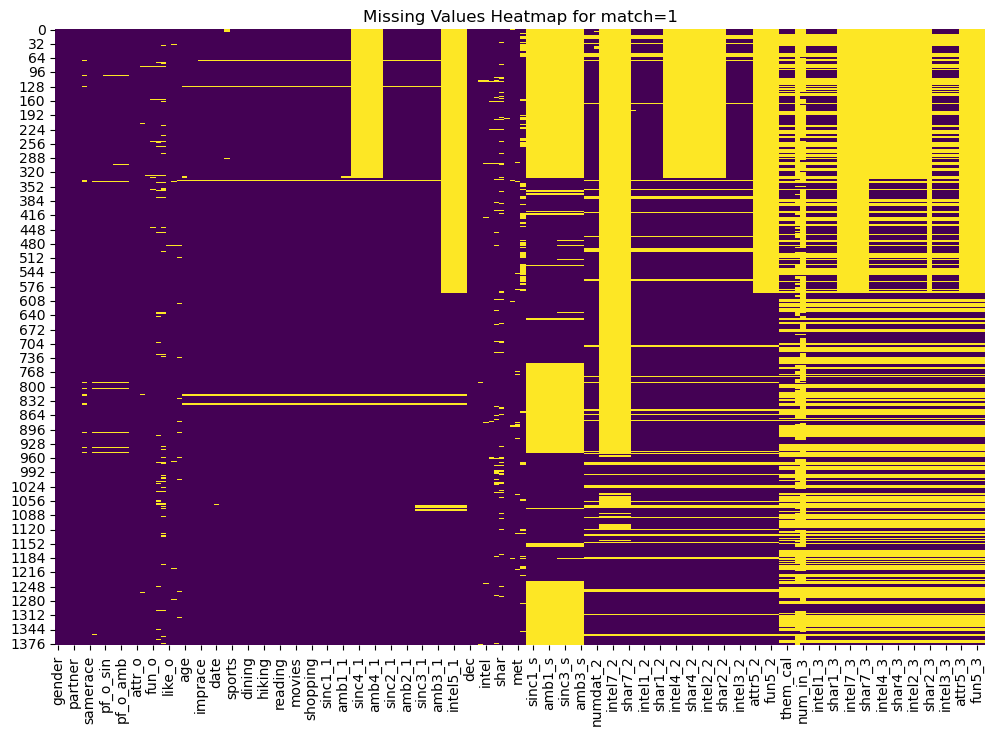

In [8]:
# Filtrer les lignes où match = 1 et réinitialiser l'index
df_match_1 = df[df['match'] == 1].reset_index(drop=True)

# Vérifier le nombre de lignes après le filtrage
print(f"Number of rows after filtering for match = 1: {df_match_1.shape[0]}")

# Visualiser les valeurs manquantes dans df_match_1
plt.figure(figsize=(12, 8))
sns.heatmap(df_match_1.isnull(), cbar=False, cmap='viridis')
plt.title('Missing Values Heatmap for match=1')
plt.show()

### Outliers


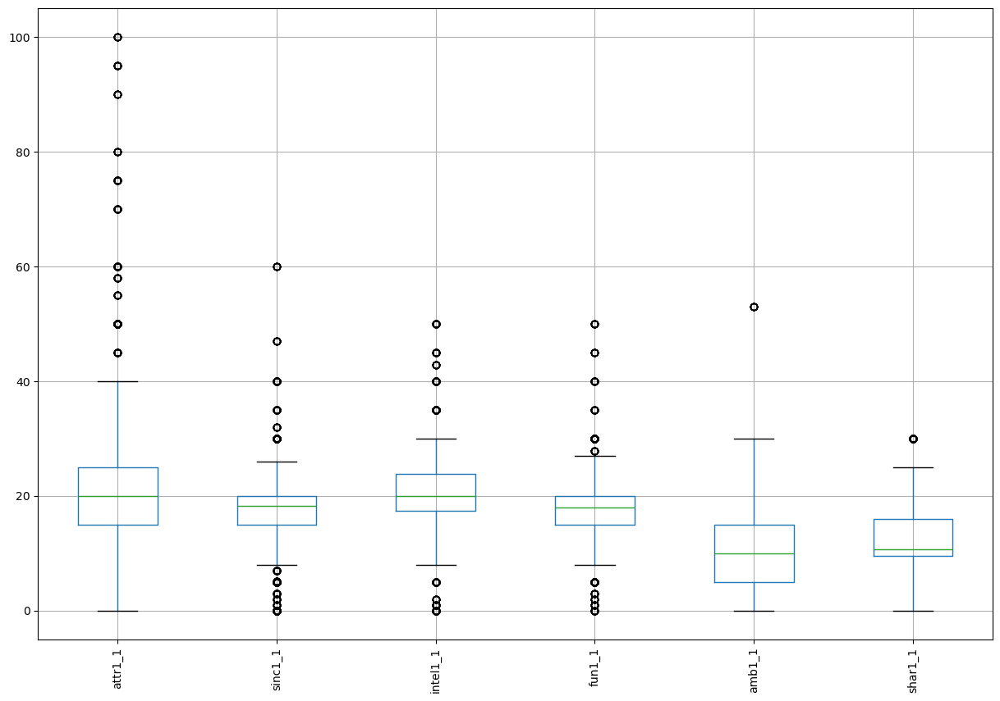

In [9]:
#Visualisation des outliers 

# Specify the columns you want to plot
columns_to_plot = ['attr1_1', 'sinc1_1', 'intel1_1', 'fun1_1', 'amb1_1', 'shar1_1']

# Plot a boxplot for only the selected columns
df[columns_to_plot].boxplot(figsize=(15, 10))

# Rotate the x-axis labels for better readability
plt.xticks(rotation=90)

# Show the plot
plt.show()

### How we manage different type of notation 

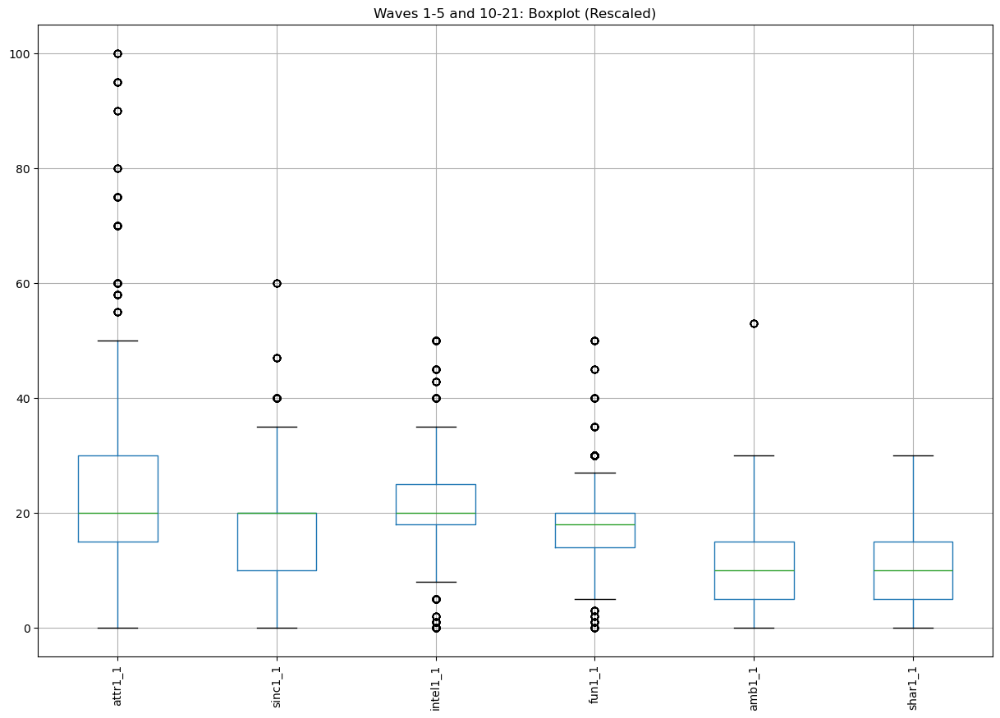

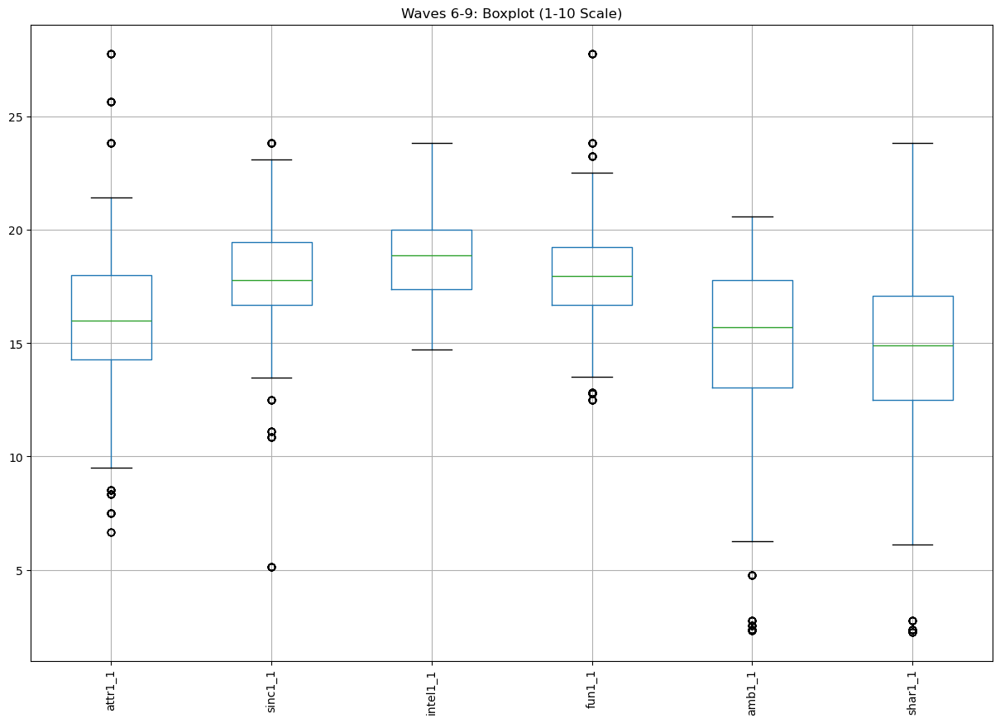

In [10]:
# Columns to rescale
columns_to_rescale = ['attr1_1', 'sinc1_1', 'intel1_1', 'fun1_1', 'amb1_1', 'shar1_1']

# Split the data into two separate DataFrames
df_wave_1_5_10_21 = df[df['wave'].isin([1, 2, 3, 4, 5, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21])]
df_wave_6_9 = df[df['wave'].isin([6, 7, 8, 9])]

# Perform analysis separately on the two DataFrames
# Example: boxplot for each set of waves
df_wave_1_5_10_21.boxplot(column=columns_to_rescale, figsize=(15, 10))
plt.xticks(rotation=90)
plt.title('Waves 1-5 and 10-21: Boxplot (Rescaled)')
plt.show()

df_wave_6_9.boxplot(column=columns_to_rescale, figsize=(15, 10))
plt.xticks(rotation=90)
plt.title('Waves 6-9: Boxplot (1-10 Scale)')
plt.show()

### Descriptive Statistics


In [11]:
df.describe(include='all')


,gender,wave,round,partner,match,int_corr,samerace,age_o,race_o,pf_o_sin,...,attr3_3,sinc3_3,intel3_3,fun3_3,amb3_3,attr5_3,sinc5_3,intel5_3,fun5_3,amb5_3
count,8378.000000,8378.000000,8378.000000,8378.000000,8378.000000,8220.000000,8378.000000,8274.000000,8305.000000,8289.000000,...,3974.000000,3974.000000,3974.000000,3974.000000,3974.000000,2016.000000,2016.000000,2016.000000,2016.000000,2016.000000
mean,0.500597,11.350919,16.872046,8.963595,0.164717,0.196010,0.395799,26.364999,2.756653,17.396867,...,7.240312,8.093357,8.388777,7.658782,7.391545,6.810020,7.615079,7.932540,7.155258,7.048611
std,0.500029,5.995903,4.358458,5.491068,0.370947,0.303539,0.489051,3.563648,1.230689,7.044003,...,1.576596,1.610309,1.459094,1.744670,1.961417,1.507341,1.504551,1.340868,1.672787,1.717988
min,0.000000,1.000000,5.000000,1.000000,0.000000,-0.830000,0.000000,18.000000,1.000000,0.000000,...,2.000000,2.000000,3.000000,2.000000,1.000000,2.000000,2.000000,4.000000,1.000000,1.000000
25%,0.000000,7.000000,14.000000,4.000000,0.000000,-0.020000,0.000000,24.000000,2.000000,15.000000,...,7.000000,7.000000,8.000000,7.000000,6.000000,6.000000,7.000000,7.000000,6.000000,6.000000
50%,1.000000,11.000000,18.000000,8.000000,0.000000,0.210000,0.000000,26.000000,2.000000,18.370000,...,7.000000,8.000000,8.000000,8.000000,8.000000,7.000000,8.000000,8.000000,7.000000,7.000000
75%,1.000000,15.000000,20.000000,13.000000,0.000000,0.430000,1.000000,28.000000,4.000000,20.000000,...,8.000000,9.000000,9.000000,9.000000,9.000000,8.000000,9.000000,9.000000,8.000000,8.000000
max,1.000000,21.000000,22.000000,22.000000,1.000000,0.910000,1.000000,55.000000,6.000000,60.000000,...,12.000000,12.000000,12.000000,12.000000,12.000000,10.000000,10.000000,10.000000,10.000000,10.000000


# EDA (Visualization)


1. To begin with, we need to analyze the demographics and characteristics of the participants who typically attend speed dating events.  
   This will allow us to understand who they are, which in turn could help us identify patterns in behavior or preferences.

2. We aim to explore how participants’ preferences for their ideal partner influence the likelihood of a match.  
   We'll analyze which criteria participants prioritize when making decisions and how these align with their eventual matches.

3.  We explore other non-attribute factors:  
   - **Self-perception**: How participants view themselves.  
   - **Ethnic background**: Role in match decisions.  
   - **Lifestyle**: Impact of career and hobbies.  
   - **Logistics**:  
     - Does match count affect future matches?  
     - Is it better to be among the last to participate?

# Demographics and Characteristics

### Match Analysis

In [12]:
#First step :
#Match Percentages
#There are 16,5% of match, higher then the average : Women on Tinder have a higher match rate at 10%, while men have a match rate of 0.6%.
colors = ['#FD2C72', '#FE4A51']  # Couleurs personnalisées

# Compter les occurrences de 'match' et créer un DataFrame avec des colonnes nommées
df_match = df["match"].value_counts().reset_index()
df_match.columns = ['match', 'count']  # Renommer les colonnes

# Créer un graphique en secteurs avec les bonnes colonnes et les couleurs personnalisées
fig = px.pie(df_match, names='match', values='count', color_discrete_sequence=colors, title = "Match Percentages")
fig.show()

### Gender analysis

In [60]:
# Dictionnaire pour mapper les valeurs
gender_map = {1: "Male", 0: "Female"}

# Créer une nouvelle colonne avec les labels correspondants
df['gender_label'] = df['gender'].map(gender_map)

# Créer le graphique avec la nouvelle colonne 'gender_label'
fig = px.pie(df, names='gender_label', title="Proportion Male/Female", color_discrete_sequence=colors)
fig.show()

In [62]:
# Prepare the data
df_filtered['gender_label'] = df_filtered['gender'].map({0: 'Female', 1: 'Male'})
like_o_summary = df_filtered.groupby('gender_label')['like_o'].sum().reset_index()
dec_o_summary = df_filtered.groupby('gender_label')['dec_o'].sum().reset_index()

# Create the bar plots
fig = go.Figure()

# Add bars for like_o
fig.add_trace(go.Bar(
    x=like_o_summary['gender_label'],
    y=like_o_summary['like_o'],
    name='Like_o',
    marker_color='#FD2C72',  # Color for Female
    text=like_o_summary['like_o'],  # Values to display on bars
    textposition='outside'  # Position of the text
))

# Add bars for dec_o
fig.add_trace(go.Bar(
    x=dec_o_summary['gender_label'],
    y=dec_o_summary['dec_o'],
    name='Dec_o',
    marker_color='#FE4A51',  # Color for Male
    text=dec_o_summary['dec_o'],  # Values to display on bars
    textposition='outside'  # Position of the text
))

# Update layout
fig.update_layout(
    barmode='group',
    title='Comparison of Like_o and Dec_o by Gender',
    xaxis_title='Gender',
    yaxis_title='Count',
    height=600,  # Increase the height of the graph
)

# Display the plot
fig.show()

C:\Users\leasc\AppData\Local\Temp\ipykernel_25860\15244524.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



### Age analysis

In [14]:
''' To have an overall visualization of our data:
   - We will create a variable `age_group` to segment ages into different ranges.
   - We will reformat the `gender` variable to use "Male/Female" instead of 0/1.'''
# The population density is concentrated under 30 years old
# Set bin size for age groups in 5-year intervals (18 to 55), ensuring 55 is included in the last bin
df['age_group'] = pd.cut(df['age'], bins=[18, 23, 28, 33, 38, 43, 48, 56], right=False, labels=[
    '18-22', '23-27', '28-32', '33-37', '38-42', '43-47', '48-55'])

# Mapping gender numbers to their respective labels
gender_mapping = {
    0: 'Female',
    1: 'Male'
}

# Apply the mapping to the 'gender' column
df['gender_label'] = df['gender'].map(gender_mapping)

# Count the occurrences of each age group per gender
age_gender_counts = df.groupby(['age_group', 'gender_label'], observed=False).size().reset_index(name='Count')

# Calculate the percentage of each age group within each gender
age_gender_counts['Percentage'] = age_gender_counts.groupby('gender_label')['Count'].transform(lambda x: x / x.sum() * 100)

# Invert the counts for Female so that it can be displayed on the left
age_gender_counts.loc[age_gender_counts['gender_label'] == 'Female', 'Count'] *= -1

# Combine count and percentage for labeling
age_gender_counts['Label'] = age_gender_counts.apply(lambda row: f"{abs(row['Count'])} ({row['Percentage']:.1f}%)", axis=1)

# Custom colors for Female and Male
colors = ['#FD2C72', '#FE4A51']

# Create the population pyramid (stacked horizontal bar chart)
fig = px.bar(age_gender_counts, x='Count', y='age_group', color='gender_label', orientation='h',
             title='Age Pyramid by Gender (5-Year Intervals)',
             labels={'age_group': 'Age Group', 'Count': 'Number of People', 'gender_label': 'Gender'},
             color_discrete_sequence=colors, text=age_gender_counts['Label'])  # Add count and percentage as labels

# Update layout: adjust figure size, font size, and add custom labels
fig.update_layout(
    title_font_size=18,
    title_x=0.5,
    xaxis_tickfont_size=12,
    yaxis_tickfont_size=12,
    xaxis_title='Number of People',
    yaxis_title='Age Group',
    width=900,  # Increase width
    height=600  # Adjust height for better spacing
)

# Show the chart
fig.show()

In [61]:
# Créer des tranches d'âge de 5 ans comme décrit
bins = [18, 23, 28, 33, 38, 43, 48, 56]
labels = ['18-22', '23-27', '28-32', '33-37', '38-42', '43-47', '48-55']

# Créer une copie du DataFrame original
df_copy = df.copy()

df_copy['age_group'] = pd.cut(df_copy['age'], bins=bins, right=False, labels=labels)
df_copy['partner_age_group'] = pd.cut(df_copy['age_o'], bins=bins, right=False, labels=labels)

# Mapping des genres (ajout explicite pour la clarté dans les graphiques)
gender_mapping = {0: 'Female', 1: 'Male'}
df_copy['gender_label'] = df_copy['gender'].map(gender_mapping)
df_copy['partner_gender_label'] = df_copy['gender'].map(lambda x: 'Male' if x == 0 else 'Female')

# Fonction pour calculer les pourcentages de tranches d'âge rencontrées
def calculate_age_meeting_percentages(df):
    # Compter les occurrences des combinaisons de tranches d'âges rencontrées
    age_meeting_counts = df.groupby(['age_group', 'partner_age_group', 'gender_label', 'partner_gender_label']).size().reset_index(name='Count')
    
    # Calculer le pourcentage de chaque tranche d'âge rencontrée pour chaque tranche d'âge de l'individu
    age_meeting_counts['Percentage'] = age_meeting_counts.groupby(['age_group', 'gender_label'])['Count'].transform(lambda x: x / x.sum() * 100)
    
    return age_meeting_counts

# Calcul des pourcentages pour toutes les rencontres
age_meeting_percentages = calculate_age_meeting_percentages(df_copy)

# Calcul des pourcentages uniquement pour les rencontres ayant abouti à un match (match = 1)
age_meeting_percentages_match = calculate_age_meeting_percentages(df_copy[df_copy['match'] == 1])

# Fonction pour afficher les graphiques en barres empilées
def plot_stacked_bar(data, title):
    # Couleurs personnalisées pour 7 tranches d'âge
    colors = ['#FF6F61', '#FF9A8B', '#FFB3AB', '#FFCCB6', '#D6E5E5', '#A2D9CE', '#7FB3D5']
    
    fig = px.bar(data, x='age_group', y='Percentage', color='partner_age_group',
                 facet_col='gender_label',  # Ajouter des facettes par genre
                 labels={'age_group': 'Age Group', 'Percentage': 'Percentage of Encounters', 'partner_age_group': 'Partner Age Group'},
                 title=title, color_discrete_sequence=colors)

    # Mise à jour du layout
    fig.update_layout(
        title_font_size=18,
        title_x=0.5,
        xaxis_tickfont_size=12,
        yaxis_tickfont_size=12,
        xaxis_title='Age Group',
        yaxis_title='Percentage of Encounters',
        width=900,
        height=600,
        plot_bgcolor='#F0F2F4',  # Fond personnalisé
        paper_bgcolor='#F0F2F4'  # Fond du papier
    )
    
    fig.show()

# Afficher le graphique pour toutes les rencontres
plot_stacked_bar(age_meeting_percentages, "Age Group Encounters for All Dates")

# Afficher le graphique pour les matchs (match = 1)
plot_stacked_bar(age_meeting_percentages_match, "Age Group Encounters for Matches Only")

# Analyser les meilleures configurations pour provoquer un match
def analyze_best_age_match_configurations(df):
    # Calculer les pourcentages pour les matchs
    best_matches = df[df['match'] == 1].groupby(['age_group', 'partner_age_group']).size().reset_index(name='Count')
    best_matches['Percentage'] = best_matches.groupby('age_group')['Count'].transform(lambda x: x / x.sum() * 100)
    
    # Supprimer les lignes où la colonne Percentage est NaN
    best_matches = best_matches.dropna(subset=['Percentage'])
    
    # Trouver la combinaison ayant le plus grand pourcentage de match pour chaque tranche d'âge
    best_matches = best_matches.loc[best_matches.groupby('age_group')['Percentage'].idxmax()]
    
    return best_matches

# Afficher les meilleures configurations de match
best_age_match_configurations = analyze_best_age_match_configurations(df_copy)
print("Best Age Group Configurations for Matches:")
print(best_age_match_configurations)

C:\Users\leasc\AppData\Local\Temp\ipykernel_25860\2572034593.py:19: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\leasc\AppData\Local\Temp\ipykernel_25860\2572034593.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\leasc\AppData\Local\Temp\ipykernel_25860\2572034593.py:19: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\leasc\AppData\Local\Temp\ipykernel_25860\2572034593.py:22: FutureWarning:

c:\Users\leasc\anaconda3\Lib\site-packages\plotly\express\_core.py:1958: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



C:\Users\leasc\AppData\Local\Temp\ipykernel_25860\2572034593.py:67: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\leasc\AppData\Local\Temp\ipykernel_25860\2572034593.py:68: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\leasc\AppData\Local\Temp\ipykernel_25860\2572034593.py:74: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



ValueError: attempt to get argmax of an empty sequence

### Race Analysis

In [18]:
# Mapping des numéros de race vers leurs descriptions respectives (seulement pour le graphique)
race_mapping = {
    1: 'Black/African American',
    2: 'European/Caucasian-American',
    3: 'Latino/Hispanic American',
    4: 'Asian/Pacific Islander/Asian-American',
    5: 'Native American',
    6: 'Other'
}

# Appliquer le mapping uniquement pour le graphique sans modifier la base de données
df['race_label'] = df['race'].map(race_mapping)

# Compter les occurrences de chaque catégorie de race
race_counts = df['race_label'].value_counts().reset_index()
race_counts.columns = ['Race', 'Count']  # Renommer les colonnes pour plus de clarté

# Couleurs personnalisées pour chaque catégorie de race (nuances de rose/rouge)
colors = ['#FD2C72', '#FE4A51', '#FF6A61', '#FF8A7B', '#FFA69B', '#FFC2BD']

# Créer le graphique en camembert (pie chart)
fig = px.pie(race_counts, names='Race', values='Count', title='Race Distribution',
             color='Race', color_discrete_sequence=colors)

# Mettre à jour la mise en page : ajuster la taille du graphique et la taille des polices
fig.update_layout(
    title_font_size=18,
    title_x=0.5,
    width=800,
    height=500
)

# Afficher le graphique
fig.show()

### Motivation and lifestyle analysis

In [19]:
# Dictionnaire pour interpréter les options de la colonne 'goal'
goal_mapping = {
    1: 'Seemed like a fun night out',
    2: 'To meet new people',
    3: 'To get a date',
    4: 'Serious relationship',
    5: 'To say I did it',
    6: 'Other'
}

# Appliquer ce mapping uniquement pour la visualisation
df['goal_label'] = df['goal'].map(goal_mapping)

# Compter les occurrences de chaque option de goal par genre
goal_gender_counts = df.groupby(['goal_label', 'gender']).size().reset_index(name='Count')

# Trier les données du plus grand au plus petit nombre de participants
goal_gender_counts = goal_gender_counts.sort_values(by='Count', ascending=False)

# Custom colors for Female and Male
colors = ['#FD2C72', '#FE4A51']  # Rose pour Female, Rouge pour Male

# Créer l'histogramme stylisé avec barres côte à côte
fig = px.histogram(goal_gender_counts, x='goal_label', y='Count', color='gender',
                   title='Goal Distribution by Gender',
                   labels={'goal_label': 'Goal', 'Count': 'Number of People', 'gender': 'Gender (0=Female, 1=Male)'},
                   barmode='group',  # Barres côte à côte pour comparaison
                   color_discrete_sequence=colors)  # Couleurs personnalisées

# Mettre à jour la mise en page pour améliorer la lisibilité
fig.update_layout(
    title_font_size=18,
    title_x=0.5,
     xaxis_tickfont_size=10,  # Taille plus petite pour les labels de l'axe X
    yaxis_tickfont_size=10,  # Taille plus petite pour les labels de l'axe Y
    xaxis_title_font_size=12,  # Taille plus petite pour le titre de l'axe X
    yaxis_title_font_size=12,  # Taille plus petite pour le titre de l'axe Y
    width=900,
    height=600
)

# Afficher le graphique
fig.show()

In [20]:
# Dictionnaire pour interpréter les options de la colonne 'date'
date_mapping = {
    1: 'Several times a week',
    2: 'Twice a week',
    3: 'Once a week',
    4: 'Twice a month',
    5: 'Once a month',
    6: 'Several times a year',
    7: 'Almost never'
}

# Appliquer ce mapping uniquement pour la visualisation
df['date_label'] = df['date'].map(date_mapping)

# Forcer l'ordre des catégories pour l'affichage dans le graphique
category_order = ['Several times a week', 'Twice a week', 'Once a week', 
                  'Twice a month', 'Once a month', 'Several times a year', 'Almost never']

# Compter les occurrences de chaque option de date par genre
date_gender_counts = df.groupby(['date_label', 'gender']).size().reset_index(name='Count')

# Custom colors for Female and Male
colors = ['#FD2C72', '#FE4A51']  # Rose pour Female, Rouge pour Male

# Créer l'histogramme stylisé avec barres côte à côte et ordre spécifique des catégories
fig = px.histogram(date_gender_counts, x='date_label', y='Count', color='gender',
                   category_orders={'date_label': category_order},  # Forcer l'ordre des catégories
                   title='Date Frequency Distribution by Gender',
                   labels={'date_label': 'Date Frequency', 'Count': 'Number of People', 'gender': 'Gender (0=Female, 1=Male)'},
                   barmode='group',  # Barres côte à côte pour comparaison
                   color_discrete_sequence=colors)  # Couleurs personnalisées

# Mettre à jour la mise en page pour améliorer la lisibilité
fig.update_layout(
    title_font_size=18,
    title_x=0.5,
    xaxis_tickfont_size=10,  # Taille plus petite pour les labels de l'axe X
    yaxis_tickfont_size=10,  # Taille plus petite pour les labels de l'axe Y
    xaxis_title_font_size=12,  # Taille plus petite pour le titre de l'axe X
    yaxis_title_font_size=12,  # Taille plus petite pour le titre de l'axe Y
    width=900,
    height=600
)

# Afficher le graphique
fig.show()

### Career analysis

In [21]:
# Dictionnaire pour interpréter les options de la colonne 'career_c'
career_mapping = {
    1: 'Lawyer',
    2: 'Academic/Research',
    3: 'Psychologist',
    4: 'Doctor/Medicine',
    5: 'Engineer',
    6: 'Creative Arts/Entertainment',
    7: 'Banking/Consulting/Finance/CEO/etc',
    8: 'Real Estate',
    9: 'International/Humanitarian Affairs',
    10: 'Undecided',
    11: 'Social Work',
    12: 'Speech Pathology',
    13: 'Politics',
    14: 'Pro sports/Athletics',
    15: 'Other',
    16: 'Journalism',
    17: 'Architecture'
}

# Mapping des genres
gender_mapping = {
    0: 'Female',
    1: 'Male'
}

# Créer des colonnes temporaires pour le mapping sans écraser la base de données
df['career_label_temp'] = df['career_c'].map(career_mapping)
df['gender_label_temp'] = df['gender'].map(gender_mapping)

# Compter les occurrences de chaque catégorie de carrière par genre
career_gender_counts = df.groupby(['career_label_temp', 'gender_label_temp']).size().reset_index(name='Count')

# Calculer le nombre total par carrière pour trier du plus grand au plus petit
career_totals = career_gender_counts.groupby('career_label_temp')['Count'].sum().reset_index(name='Total')
career_gender_counts = pd.merge(career_gender_counts, career_totals, on='career_label_temp')

# Trier les carrières du plus grand au plus petit
career_gender_counts = career_gender_counts.sort_values(by='Total', ascending=False)

# Couleurs personnalisées pour les genres
colors = ['#FD2C72', '#FE4A51']

# Créer le graphique en barres groupées
fig = px.bar(career_gender_counts, x='career_label_temp', y='Count', color='gender_label_temp', barmode='group',
             title='Career Distribution by Gender',
             labels={'career_label_temp': 'Career', 'Count': 'Number of People', 'gender_label_temp': 'Gender'},
             color_discrete_sequence=colors)

# Mettre à jour la mise en page pour améliorer la lisibilité
fig.update_layout(
    title_font_size=18,
    title_x=0.5,
    xaxis_tickfont_size=10,  # Taille plus petite pour les labels de l'axe X
    yaxis_tickfont_size=12,  # Taille pour les labels de l'axe Y
    width=900,  # Augmenter la largeur pour une meilleure visibilité des labels
    height=600  # Ajuster la hauteur pour un espacement optimal
)

# Rotation des labels sur l'axe X pour une meilleure lisibilité
fig.update_xaxes(tickangle=-45)

# Afficher le graphique
fig.show()

### Activities Analysis

In [26]:
# Liste des colonnes d'activités
activities = ['sports', 'tvsports', 'exercise', 'dining', 'museums', 'art', 'hiking', 'gaming', 
              'clubbing', 'reading', 'tv', 'theater', 'movies', 'concerts', 'music', 'shopping', 'yoga']

# Moyenne des réponses pour chaque activité par genre
activity_by_gender = df.groupby('gender')[activities].mean().reset_index()

# Créer des colonnes temporaires pour les labels de genre
activity_by_gender['gender_label'] = activity_by_gender['gender'].map({0: 'Female', 1: 'Male'})

# Transformer les données pour les adapter à un diagramme polaire (sans inclure gender comme activité)
activity_melted = pd.melt(activity_by_gender, id_vars='gender_label', value_vars=activities, 
                          var_name='Activity', value_name='Average Score')

# Couleurs personnalisées pour les genres
colors = ['#FD2C72', '#E4BC3C']  # Rose pour Female, Rouge pour Male

# Créer le graphique polaire combiné avec les deux genres
fig = px.line_polar(activity_melted, r='Average Score', theta='Activity', line_close=True, 
                    title='Activity Preferences by Gender', color='gender_label', color_discrete_sequence=colors)

# Mise à jour du layout pour un graphique plus grand, épaississement des lignes, et suppression des labels 'gender' dans les activités
fig.update_traces(line=dict(width=4))  # Épaissir les lignes

fig.update_layout(
    title_font_size=20,
    polar=dict(
        radialaxis=dict(visible=True, range=[0, 10])
    ),
    template='plotly_white',
    plot_bgcolor='#F0F2F4',  # Fond personnalisé
    paper_bgcolor='#F0F2F4',  # Fond du papier
    width=900,  # Augmenter la taille du graphique
    height=800,  # Augmenter la hauteur
    showlegend=True,  # Afficher la légende avec les couleurs de genre
    legend_title_text='Gender'  # Garder le titre de la légende
)

# Afficher le graphique
fig.show()


AttributeError: 'DataFrame' object has no attribute 'append'

# Second Step : Attributes Analysis

In [28]:
# Sample DataFrame creation (assuming df is your original DataFrame)
# df = pd.read_csv('your_data.csv')  # Replace with actual loading code

# Step 1: Filter the data for the specific attributes across phases
attribute_cols = ['attr1_1', 'attr1_s', 'attr1_2', 'attr1_3']
df_filtered = df[['gender_label'] + attribute_cols]

# Print the shape of the original and filtered DataFrame
print("Original DataFrame Shape:", df.shape)
print("Filtered DataFrame Shape:", df_filtered.shape)

# Step 2: Melt the data to long format
melted_df = df_filtered.melt(id_vars=['gender_label'], 
                             value_vars=attribute_cols, 
                             var_name='attribute_phase', 
                             value_name='rating')

# Print the shape of the melted DataFrame
print("DataFrame Shape After Melt:", melted_df.shape)

# Step 3: Extract phase and attribute information from the 'attribute_phase' column
melted_df['attribute'] = melted_df['attribute_phase'].str.split('_').str[0]
melted_df['phase'] = melted_df['attribute_phase'].str.split('_').str[1]

# Define phase names for better readability
phase_mapping = {
    'attr1_1': 'Sign Up',
    'attr1_s': 'Halfway',
    'attr1_2': 'Follow-up Time2',
    'attr1_3': 'Follow-up2 Time3'
}

# Map phases to the readable names
melted_df['phase'] = melted_df['attribute_phase'].map(phase_mapping)

# Drop 'attribute_phase' column if no longer needed
melted_df.drop(columns='attribute_phase', inplace=True)

# Print the first few rows to verify
print(melted_df.head())

# Plot the data
fig = px.box(melted_df, x='attribute', y='rating', color='gender_label', facet_col='phase',
             labels={'attribute': 'Attribute', 'rating': 'Rating'},
             title="Distribution of Ratings by Attribute, Phase, and Gender")

# Update layout for better appearance
fig.update_layout(
    title_font_size=18,
    title_x=0.5,
    xaxis_title='Attribute',
    yaxis_title='Rating',
    paper_bgcolor='#F0F2F4'
)

# Show the plot
fig.show()

Original DataFrame Shape: (8378, 183)
Filtered DataFrame Shape: (8378, 5)
DataFrame Shape After Melt: (33512, 3)
  gender_label  rating attribute    phase
0       Female    15.0     attr1  Sign Up
1       Female    15.0     attr1  Sign Up
2       Female    15.0     attr1  Sign Up
3       Female    15.0     attr1  Sign Up
4       Female    15.0     attr1  Sign Up


In [29]:
# Sample DataFrame creation (assuming df is your original DataFrame)
# df = pd.read_csv('your_data.csv')  # Replace with actual loading code

# Step 1: Filter the data for the specific attributes across phases
attribute_cols = ['sinc1_1', 'sinc1_s', 'sinc1_2', 'sinc1_3']
df_filtered = df[['gender_label'] + attribute_cols]

# Print the shape of the original and filtered DataFrame
print("Original DataFrame Shape:", df.shape)
print("Filtered DataFrame Shape:", df_filtered.shape)

# Step 2: Melt the data to long format
melted_df = df_filtered.melt(id_vars=['gender_label'], 
                             value_vars=attribute_cols, 
                             var_name='attribute_phase', 
                             value_name='rating')

# Print the shape of the melted DataFrame
print("DataFrame Shape After Melt:", melted_df.shape)

# Step 3: Extract phase and attribute information from the 'attribute_phase' column
melted_df['attribute'] = melted_df['attribute_phase'].str.split('_').str[0]
melted_df['phase'] = melted_df['attribute_phase'].str.split('_').str[1]

# Define phase names for better readability
phase_mapping = {
    'sinc1_1': 'Sign Up',
    'sinc1_s': 'Halfway',
    'sinc1_2': 'Follow-up Time2',
    'sinc1_3': 'Follow-up2 Time3'
}

# Map phases to the readable names
melted_df['phase'] = melted_df['attribute_phase'].map(phase_mapping)

# Drop 'attribute_phase' column if no longer needed
melted_df.drop(columns='attribute_phase', inplace=True)

# Print the first few rows to verify
print(melted_df.head())

# Plot the data
fig = px.box(melted_df, x='attribute', y='rating', color='gender_label', facet_col='phase',
             labels={'attribute': 'Attribute', 'rating': 'Rating'},
             title="Distribution of Ratings by Attribute, Phase, and Gender")

# Update layout for better appearance
fig.update_layout(
    title_font_size=18,
    title_x=0.5,
    xaxis_title='Attribute',
    yaxis_title='Rating',
    paper_bgcolor='#F0F2F4'
)

# Show the plot
fig.show()

Original DataFrame Shape: (8378, 183)
Filtered DataFrame Shape: (8378, 5)
DataFrame Shape After Melt: (33512, 3)
  gender_label  rating attribute    phase
0       Female    20.0     sinc1  Sign Up
1       Female    20.0     sinc1  Sign Up
2       Female    20.0     sinc1  Sign Up
3       Female    20.0     sinc1  Sign Up
4       Female    20.0     sinc1  Sign Up


In [30]:
# Sample DataFrame creation (assuming df is your original DataFrame)
# df = pd.read_csv('your_data.csv')  # Replace with actual loading code

# Step 1: Filter the data for the specific attributes across phases
attribute_cols = ['intel1_1', 'intel1_s', 'intel1_2', 'intel1_3']
df_filtered = df[['gender_label'] + attribute_cols]

# Print the shape of the original and filtered DataFrame
print("Original DataFrame Shape:", df.shape)
print("Filtered DataFrame Shape:", df_filtered.shape)

# Step 2: Melt the data to long format
melted_df = df_filtered.melt(id_vars=['gender_label'], 
                             value_vars=attribute_cols, 
                             var_name='attribute_phase', 
                             value_name='rating')

# Print the shape of the melted DataFrame
print("DataFrame Shape After Melt:", melted_df.shape)

# Step 3: Extract phase and attribute information from the 'attribute_phase' column
melted_df['attribute'] = melted_df['attribute_phase'].str.split('_').str[0]
melted_df['phase'] = melted_df['attribute_phase'].str.split('_').str[1]

# Define phase names for better readability
phase_mapping = {
    'intel1_1': 'Sign Up',
    'intel1_s': 'Halfway',
    'intel1_2': 'Follow-up Time2',
    'intel1_3': 'Follow-up2 Time3'
}

# Map phases to the readable names
melted_df['phase'] = melted_df['attribute_phase'].map(phase_mapping)

# Drop 'attribute_phase' column if no longer needed
melted_df.drop(columns='attribute_phase', inplace=True)

# Print the first few rows to verify
print(melted_df.head())

# Plot the data
fig = px.box(melted_df, x='attribute', y='rating', color='gender_label', facet_col='phase',
             labels={'attribute': 'Attribute', 'rating': 'Rating'},
             title="Distribution of Ratings by Attribute, Phase, and Gender")

# Update layout for better appearance
fig.update_layout(
    title_font_size=18,
    title_x=0.5,
    xaxis_title='Attribute',
    yaxis_title='Rating',
    paper_bgcolor='#F0F2F4'
)

# Show the plot
fig.show()

Original DataFrame Shape: (8378, 183)
Filtered DataFrame Shape: (8378, 5)
DataFrame Shape After Melt: (33512, 3)
  gender_label  rating attribute    phase
0       Female    20.0    intel1  Sign Up
1       Female    20.0    intel1  Sign Up
2       Female    20.0    intel1  Sign Up
3       Female    20.0    intel1  Sign Up
4       Female    20.0    intel1  Sign Up


In [32]:
# Step 1: Filter the data for the specific attributes across phases
attribute_cols = ['fun1_1', 'fun1_s', 'fun1_2', 'fun1_3']
df_filtered = df[['gender_label'] + attribute_cols]

# Print the shape of the original and filtered DataFrame
print("Original DataFrame Shape:", df.shape)
print("Filtered DataFrame Shape:", df_filtered.shape)

# Step 2: Melt the data to long format
melted_df = df_filtered.melt(id_vars=['gender_label'], 
                             value_vars=attribute_cols, 
                             var_name='attribute_phase', 
                             value_name='rating')

# Print the shape of the melted DataFrame
print("DataFrame Shape After Melt:", melted_df.shape)

# Step 3: Extract phase and attribute information from the 'attribute_phase' column
melted_df['attribute'] = melted_df['attribute_phase'].str.split('_').str[0]
melted_df['phase'] = melted_df['attribute_phase'].str.split('_').str[1]

# Define phase names for better readability
phase_mapping = {
    'fun1_1': 'Sign Up',
    'fun1_s': 'Halfway',
    'fun1_2': 'Follow-up Time2',
    'fun1_3': 'Follow-up2 Time3'
}

# Map phases to the readable names
melted_df['phase'] = melted_df['attribute_phase'].map(phase_mapping)

# Drop 'attribute_phase' column if no longer needed
melted_df.drop(columns='attribute_phase', inplace=True)

# Print the first few rows to verify
print(melted_df.head())

# Plot the data
fig = px.box(melted_df, x='attribute', y='rating', color='gender_label', facet_col='phase',
             labels={'attribute': 'Attribute', 'rating': 'Rating'},
             title="Distribution of Ratings by Attribute, Phase, and Gender")

# Update layout for better appearance
fig.update_layout(
    title_font_size=18,
    title_x=0.5,
    xaxis_title='Attribute',
    yaxis_title='Rating',
    paper_bgcolor='#F0F2F4'
)

# Show the plot
fig.show()

Original DataFrame Shape: (8378, 183)
Filtered DataFrame Shape: (8378, 5)
DataFrame Shape After Melt: (33512, 3)
  gender_label  rating attribute    phase
0       Female    15.0      fun1  Sign Up
1       Female    15.0      fun1  Sign Up
2       Female    15.0      fun1  Sign Up
3       Female    15.0      fun1  Sign Up
4       Female    15.0      fun1  Sign Up


In [33]:
# Sample DataFrame creation (assuming df is your original DataFrame)
# df = pd.read_csv('your_data.csv')  # Replace with actual loading code

# Step 1: Filter the data for the specific attributes across phases
attribute_cols = ['amb1_1', 'amb1_s', 'amb1_2', 'amb1_3']
df_filtered = df[['gender_label'] + attribute_cols]

# Print the shape of the original and filtered DataFrame
print("Original DataFrame Shape:", df.shape)
print("Filtered DataFrame Shape:", df_filtered.shape)

# Step 2: Melt the data to long format
melted_df = df_filtered.melt(id_vars=['gender_label'], 
                             value_vars=attribute_cols, 
                             var_name='attribute_phase', 
                             value_name='rating')

# Print the shape of the melted DataFrame
print("DataFrame Shape After Melt:", melted_df.shape)

# Step 3: Extract phase and attribute information from the 'attribute_phase' column
melted_df['attribute'] = melted_df['attribute_phase'].str.split('_').str[0]
melted_df['phase'] = melted_df['attribute_phase'].str.split('_').str[1]

# Define phase names for better readability
phase_mapping = {
    'amb1_1': 'Sign Up',
    'amb1_s': 'Halfway',
    'amb1_2': 'Follow-up Time2',
    'amb1_3': 'Follow-up2 Time3'
}

# Map phases to the readable names
melted_df['phase'] = melted_df['attribute_phase'].map(phase_mapping)

# Drop 'attribute_phase' column if no longer needed
melted_df.drop(columns='attribute_phase', inplace=True)

# Print the first few rows to verify
print(melted_df.head())

# Plot the data
fig = px.box(melted_df, x='attribute', y='rating', color='gender_label', facet_col='phase',
             labels={'attribute': 'Attribute', 'rating': 'Rating'},
             title="Distribution of Ratings by Attribute, Phase, and Gender")

# Update layout for better appearance
fig.update_layout(
    title_font_size=18,
    title_x=0.5,
    xaxis_title='Attribute',
    yaxis_title='Rating',
    paper_bgcolor='#F0F2F4'
)

# Show the plot
fig.show()

Original DataFrame Shape: (8378, 183)
Filtered DataFrame Shape: (8378, 5)
DataFrame Shape After Melt: (33512, 3)
  gender_label  rating attribute    phase
0       Female    15.0      amb1  Sign Up
1       Female    15.0      amb1  Sign Up
2       Female    15.0      amb1  Sign Up
3       Female    15.0      amb1  Sign Up
4       Female    15.0      amb1  Sign Up


In [34]:
# Sample DataFrame creation (assuming df is your original DataFrame)
# df = pd.read_csv('your_data.csv')  # Replace with actual loading code

# Step 1: Filter the data for the specific attributes across phases
attribute_cols = ['shar1_1', 'shar1_s', 'shar1_2', 'shar1_3']
df_filtered = df[['gender_label'] + attribute_cols]

# Print the shape of the original and filtered DataFrame
print("Original DataFrame Shape:", df.shape)
print("Filtered DataFrame Shape:", df_filtered.shape)

# Step 2: Melt the data to long format
melted_df = df_filtered.melt(id_vars=['gender_label'], 
                             value_vars=attribute_cols, 
                             var_name='attribute_phase', 
                             value_name='rating')

# Print the shape of the melted DataFrame
print("DataFrame Shape After Melt:", melted_df.shape)

# Step 3: Extract phase and attribute information from the 'attribute_phase' column
melted_df['attribute'] = melted_df['attribute_phase'].str.split('_').str[0]
melted_df['phase'] = melted_df['attribute_phase'].str.split('_').str[1]

# Define phase names for better readability
phase_mapping = {
    'shar1_1': 'Sign Up',
    'shar1_s': 'Halfway',
    'shar1_2': 'Follow-up Time2',
    'shar1_3': 'Follow-up2 Time3'
}

# Map phases to the readable names
melted_df['phase'] = melted_df['attribute_phase'].map(phase_mapping)

# Drop 'attribute_phase' column if no longer needed
melted_df.drop(columns='attribute_phase', inplace=True)

# Print the first few rows to verify
print(melted_df.head())

# Plot the data
fig = px.box(melted_df, x='attribute', y='rating', color='gender_label', facet_col='phase',
             labels={'attribute': 'Attribute', 'rating': 'Rating'},
             title="Distribution of Ratings by Attribute, Phase, and Gender")

# Update layout for better appearance
fig.update_layout(
    title_font_size=18,
    title_x=0.5,
    xaxis_title='Attribute',
    yaxis_title='Rating',
    paper_bgcolor='#F0F2F4'
)

# Show the plot
fig.show()

Original DataFrame Shape: (8378, 183)
Filtered DataFrame Shape: (8378, 5)
DataFrame Shape After Melt: (33512, 3)
  gender_label  rating attribute    phase
0       Female    15.0     shar1  Sign Up
1       Female    15.0     shar1  Sign Up
2       Female    15.0     shar1  Sign Up
3       Female    15.0     shar1  Sign Up
4       Female    15.0     shar1  Sign Up


In [36]:
# Suppose df_copy is your DataFrame
# Filter the DataFrame for goal_label == 'Seemed like a fun night out'
filtered_df = df_copy[df_copy['goal_label'] == 'Seemed like a fun night out']

# Define the columns for the attributes you want to analyze
attribute_cols = ['attr7_2', 'sinc7_2', 'intel7_2', 'fun7_2', 'amb7_2', 'shar7_2']

# Melt the filtered DataFrame to long format
melted_df = filtered_df.melt(id_vars=['gender'], value_vars=attribute_cols, 
                             var_name='attribute', value_name='rating')

# Convert 'gender' to 'gender_label'
melted_df['gender_label'] = melted_df['gender'].map({0: 'Female', 1: 'Male'})

# Create the box plot using Plotly Express
fig = px.box(melted_df, x='attribute', y='rating', color='gender_label',
             labels={'attribute': 'Attribute', 'rating': 'Rating', 'gender_label': 'Gender'},
             title="Distribution of Ratings by Attribute and Gender for Goal: 'Seemed like a fun night out'")

# Update layout for better appearance
fig.update_layout(
    title_font_size=18,
    title_x=0.5,
    xaxis_title='Attribute',
    yaxis_title='Rating',
    boxmode='group',
    paper_bgcolor='#F0F2F4'
)

# Show the plot
fig.show()

In [37]:
# Filter the DataFrame for goal_label == 'To meet new people'
filtered_df = df_copy[df_copy['goal_label'] == 'To meet new people']

# Define the columns for the attributes you want to analyze
attribute_cols = ['attr7_2', 'sinc7_2', 'intel7_2', 'fun7_2', 'amb7_2', 'shar7_2']

# Melt the filtered DataFrame to long format
melted_df = filtered_df.melt(id_vars=['gender'], value_vars=attribute_cols, 
                             var_name='attribute', value_name='rating')

# Convert 'gender' to 'gender_label'
melted_df['gender_label'] = melted_df['gender'].map({0: 'Female', 1: 'Male'})

# Create the box plot using Plotly Express
fig = px.box(melted_df, x='attribute', y='rating', color='gender_label',
             labels={'attribute': 'Attribute', 'rating': 'Rating', 'gender_label': 'Gender'},
             title="Distribution of Ratings by Attribute and Gender for Goal: 'To meet new people'")

# Update layout for better appearance
fig.update_layout(
    title_font_size=18,
    title_x=0.5,
    xaxis_title='Attribute',
    yaxis_title='Rating',
    boxmode='group',
    paper_bgcolor='#F0F2F4'
)

# Show the plot
fig.show()

In [38]:
# Filter the DataFrame for goal_label == 'Serious relationship'
filtered_df = df_copy[df_copy['goal_label'] == 'Serious relationship']

# Define the columns for the attributes you want to analyze
attribute_cols = ['attr7_2', 'sinc7_2', 'intel7_2', 'fun7_2', 'amb7_2', 'shar7_2']

# Melt the filtered DataFrame to long format
melted_df = filtered_df.melt(id_vars=['gender'], value_vars=attribute_cols, 
                             var_name='attribute', value_name='rating')

# Convert 'gender' to 'gender_label'
melted_df['gender_label'] = melted_df['gender'].map({0: 'Female', 1: 'Male'})

# Create the box plot using Plotly Express
fig = px.box(melted_df, x='attribute', y='rating', color='gender_label',
             labels={'attribute': 'Attribute', 'rating': 'Rating', 'gender_label': 'Gender'},
             title="Distribution of Ratings by Attribute and Gender for Goal: 'Serious relationship'")

# Update layout for better appearance
fig.update_layout(
    title_font_size=18,
    title_x=0.5,
    xaxis_title='Attribute',
    yaxis_title='Rating',
    boxmode='group',
    paper_bgcolor='#F0F2F4'
)

# Show the plot
fig.show()

C:\Users\leasc\AppData\Local\Temp\ipykernel_25860\15244524.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



   ---------------------------------------- 0.0/11.6 MB ? eta -:--:--
   ---------------------------------------- 0.0/11.6 MB ? eta -:--:--
   ---------------------------------------- 0.0/11.6 MB 435.7 kB/s eta 0:00:27
   ---------------------------------------- 0.1/11.6 MB 871.5 kB/s eta 0:00:14
   - -------------------------------------- 0.5/11.6 MB 3.6 MB/s eta 0:00:04
   ------- -------------------------------- 2.2/11.6 MB 12.6 MB/s eta 0:00:01
   ---------------- ----------------------- 4.7/11.6 MB 21.3 MB/s eta 0:00:01
   -------------------------- ------------- 7.7/11.6 MB 30.8 MB/s eta 0:00:01
   ------------------------------------ --- 10.5/11.6 MB 59.5 MB/s eta 0:00:01
   ---------------------------------------  11.6/11.6 MB 65.6 MB/s eta 0:00:01
   ---------------------------------------- 11.6/11.6 MB 46.9 MB/s eta 0:00:00
   ---------------------------------------- 0.0/19.1 MB ? eta -:--:--
   ----- ---------------------------------- 2.5/19.1 MB 53.4 MB/s eta 0:00:01
   ---

In [40]:
# Liste des attributs pour la première ligne (toute la base)
attributes_all = ['attr', 'sinc', 'intel', 'fun', 'amb', 'shar']

# Liste des attributs pour la deuxième ligne avec le filtre dec == 1
attributes_filtered = ['attr1_2', 'sinc1_2', 'intel1_2', 'fun1_2', 'amb1_2', 'shar1_2']

# Filtrer les données pour dec = 1
df_filtered_5 = df[df['dec'] == 1].copy()

# Première ligne: toute la base, scatter plot splitté par genre
df_melted_all = pd.melt(df, id_vars='gender', value_vars=attributes_all, 
                        var_name='Attribute', value_name='Score')

# Deuxième ligne: filtré par dec == 1, scatter plot splitté par genre
df_melted_filtered_5 = pd.melt(df_filtered_5, id_vars='gender', value_vars=attributes_filtered, 
                               var_name='Attribute', value_name='Score')

# Créer une colonne temporaire pour les labels de genre
df_melted_all['gender_label'] = df_melted_all['gender'].map({0: 'Female', 1: 'Male'})
df_melted_filtered_5['gender_label'] = df_melted_filtered_5['gender'].map({0: 'Female', 1: 'Male'})

# Scatter plot pour la première ligne (toute la base)
fig_all = px.scatter(df_melted_all, x='Attribute', y='Score', color='gender_label', 
                     facet_col='gender_label', title='Attributes (All Data)', 
                     color_discrete_sequence=['#FD2C72', '#E4BC3C'])

# Scatter plot pour la deuxième ligne (données filtrées dec == 1)
fig_filtered_5 = px.scatter(df_melted_filtered_5, x='Attribute', y='Score', color='gender_label', 
                            facet_col='gender_label', title='Attributes (Filtered dec = 1)', 
                            color_discrete_sequence=['#FD2C72', '#E4BC3C'])

# Ajustement du layout pour fusionner les deux figures (sous-plots)
fig_all.update_layout(height=400, showlegend=False)
fig_filtered_5.update_layout(height=400, showlegend=False)

# Fusionner les deux figures dans un seul layout
from plotly.subplots import make_subplots
from plotly.graph_objs import Scatter

# Créer la grille avec 2 lignes et 2 colonnes
fig_combined = make_subplots(rows=2, cols=2, subplot_titles=['Female (All)', 'Male (All)', 
                                                             'Female (dec=1)', 'Male (dec=1)'])

# Ajouter les scatter plots pour toute la base
fig_combined.add_trace(fig_all.data[0], row=1, col=1)  # Female (All)
fig_combined.add_trace(fig_all.data[1], row=1, col=2)  # Male (All)

# Ajouter les scatter plots pour les données filtrées
fig_combined.add_trace(fig_filtered_5.data[0], row=2, col=1)  # Female (dec=1)
fig_combined.add_trace(fig_filtered_5.data[1], row=2, col=2)  # Male (dec=1)

# Mise à jour du layout global
fig_combined.update_layout(height=800, width=900, title_text="Scatter Plot of Attributes by Gender")

# Afficher la figure combinée
fig_combined.show()

In [41]:
# Liste des colonnes d'attributs à analyser
attributes = ['attr', 'sinc', 'intel', 'fun', 'amb', 'shar']

# Filtrer les données pour dec == 0
df_visualization = df[df['dec'] == 0][['gender'] + attributes].copy()

# Mapping des genres pour l'affichage
gender_mapping = {
    0: 'Female',
    1: 'Male'
}

# Appliquer le mapping sur le DataFrame de visualisation
df_visualization['gender_label'] = df_visualization['gender'].map(gender_mapping)

# Transformation des données pour obtenir les sommes des scores de chaque attribut par genre
df_melted = pd.melt(df_visualization, id_vars=['gender_label'], value_vars=attributes, 
                    var_name='Attribute', value_name='Score')

# Somme des scores pour chaque attribut par genre
attribute_gender_sums = df_melted.groupby(['Attribute', 'gender_label'], observed=False)['Score'].sum().reset_index()

# Calculer le pourcentage pour chaque attribut par genre
attribute_gender_sums['Percentage'] = attribute_gender_sums.groupby('gender_label')['Score'].transform(lambda x: x / x.sum() * 100)

# Inverser les valeurs pour 'Female' pour qu'elles soient affichées à gauche
attribute_gender_sums.loc[attribute_gender_sums['gender_label'] == 'Female', 'Score'] *= -1

# Combiner la somme et le pourcentage pour l'affichage des étiquettes
attribute_gender_sums['Label'] = attribute_gender_sums.apply(lambda row: f"{abs(row['Score']):.1f} ({row['Percentage']:.1f}%)", axis=1)

# Trier les attributs du plus grand au plus petit en fonction de la somme totale des scores (sans tenir compte du genre)
attribute_gender_sums['Total_Score'] = attribute_gender_sums['Score'].abs()
attribute_gender_sums = attribute_gender_sums.sort_values(by='Total_Score', ascending=False)

# Couleurs personnalisées pour Female et Male
colors = ['#FD2C72', '#FE4A51']

# Créer la pyramide des attributs (graphe en barres horizontales empilées)
fig = px.bar(attribute_gender_sums, x='Score', y='Attribute', color='gender_label', orientation='h',
             title='Attribute Pyramid by Gender (Sum of Scores, Sorted)',
             labels={'Attribute': 'Attribute', 'Score': 'Sum of Scores', 'gender_label': 'Gender'},
             color_discrete_sequence=colors, text=attribute_gender_sums['Label'])  # Ajouter les étiquettes avec le score et le pourcentage

# Mettre à jour la mise en page : ajuster la taille, les polices et ajouter des étiquettes personnalisées
fig.update_layout(
    title_font_size=18,
    title_x=0.5,
    xaxis_tickfont_size=12,
    yaxis_tickfont_size=12,
    xaxis_title='Sum of Scores',
    yaxis_title='Attribute',
    width=900,  # Augmenter la largeur
    height=600  # Ajuster la hauteur pour un meilleur espacement
)

# Afficher le graphique
fig.show()

In [42]:
# Liste des attributs de perception de soi et ceux notés par le/la partenaire
self_attributes = ['attr5_1', 'sinc5_1', 'intel5_1', 'fun5_1', 'amb5_1']
partner_attributes = ['attr_o', 'sinc_o', 'intel_o', 'fun_o', 'amb_o']

# Filtrer les données pour les femmes (gender == 0)
df_women = df[df['gender'] == 0][self_attributes + partner_attributes].copy()

# Calculer la moyenne et l'écart type pour les femmes
df_women_mean_self = df_women[self_attributes].mean().reset_index()
df_women_std_self = df_women[self_attributes].std().reset_index()
df_women_mean_self.columns = ['Attribute', 'Mean_Score']
df_women_std_self.columns = ['Attribute', 'Std_Dev']
df_women_mean_self['Self/Partner'] = 'Self'
df_women_mean_self['Std_Dev'] = df_women_std_self['Std_Dev']

df_women_mean_partner = df_women[partner_attributes].mean().reset_index()
df_women_std_partner = df_women[partner_attributes].std().reset_index()
df_women_mean_partner.columns = ['Attribute', 'Mean_Score']
df_women_std_partner.columns = ['Attribute', 'Std_Dev']
df_women_mean_partner['Self/Partner'] = 'Partner'
df_women_mean_partner['Std_Dev'] = df_women_std_partner['Std_Dev']

# Inverser les valeurs des moyennes pour Self afin de les afficher à gauche
df_women_mean_self['Mean_Score'] *= -1

# Aligner les attributs de perception de soi et ceux notés par le partenaire
df_women_mean_self['Attribute'] = df_women_mean_self['Attribute'].str.replace('5_1', '')
df_women_mean_partner['Attribute'] = df_women_mean_partner['Attribute'].str.replace('_o', '')

# Ajouter des colonnes pour afficher les labels des attributs du partenaire
df_women_mean_partner['Attribute_Label'] = partner_attributes

# Combiner les données de perception de soi et de la note du partenaire pour les femmes
df_women_combined = pd.concat([df_women_mean_self, df_women_mean_partner])

# Filtrer les données pour les hommes (gender == 1)
df_men = df[df['gender'] == 1][self_attributes + partner_attributes].copy()

# Calculer la moyenne et l'écart type pour les hommes
df_men_mean_self = df_men[self_attributes].mean().reset_index()
df_men_std_self = df_men[self_attributes].std().reset_index()
df_men_mean_self.columns = ['Attribute', 'Mean_Score']
df_men_std_self.columns = ['Attribute', 'Std_Dev']
df_men_mean_self['Self/Partner'] = 'Self'
df_men_mean_self['Std_Dev'] = df_men_std_self['Std_Dev']

df_men_mean_partner = df_men[partner_attributes].mean().reset_index()
df_men_std_partner = df_men[partner_attributes].std().reset_index()
df_men_mean_partner.columns = ['Attribute', 'Mean_Score']
df_men_std_partner.columns = ['Attribute', 'Std_Dev']
df_men_mean_partner['Self/Partner'] = 'Partner'
df_men_mean_partner['Std_Dev'] = df_men_std_partner['Std_Dev']

# Inverser les valeurs des moyennes pour Self afin de les afficher à gauche
df_men_mean_self['Mean_Score'] *= -1

# Aligner les attributs de perception de soi et ceux notés par le partenaire
df_men_mean_self['Attribute'] = df_men_mean_self['Attribute'].str.replace('5_1', '')
df_men_mean_partner['Attribute'] = df_men_mean_partner['Attribute'].str.replace('_o', '')

# Ajouter des colonnes pour afficher les labels des attributs du partenaire
df_men_mean_partner['Attribute_Label'] = partner_attributes

# Combiner les données de perception de soi et de la note du partenaire pour les hommes
df_men_combined = pd.concat([df_men_mean_self, df_men_mean_partner])

# Couleurs personnalisées pour Self et Partner
colors = ['#FD2C72', '#FE4A51']

# Créer la pyramide pour les femmes
fig_women = px.bar(df_women_combined, x='Mean_Score', y='Attribute', color='Self/Partner', orientation='h',
                   title="Mean Self vs Partner Ratings for Women (With Std Dev)",
                   labels={'Attribute': 'Attribute', 'Mean_Score': 'Mean Score', 'Self/Partner': 'Self vs Partner'},
                   color_discrete_sequence=colors, text='Mean_Score')

# Ajouter les labels des attributs notés par les partenaires pour les femmes en dehors du graphique
for i, row in df_women_mean_partner.iterrows():
    fig_women.add_annotation(x=1.05 * max(df_women_combined['Mean_Score']), y=row['Attribute'],
                             text=row['Attribute_Label'], showarrow=False, xanchor='left', font=dict(size=12))

# Ajouter l'écart type au centre (niveau x=0) de chaque attribut pour les femmes
for i, row in df_women_combined.iterrows():
    if row['Self/Partner'] == 'Self':  # Ajouter au centre pour chaque attribut
        fig_women.add_annotation(x=0, y=row['Attribute'],
                                 text=f"±{row['Std_Dev']:.2f}", showarrow=False, font=dict(size=10))

# Créer la pyramide pour les hommes
fig_men = px.bar(df_men_combined, x='Mean_Score', y='Attribute', color='Self/Partner', orientation='h',
                 title="Mean Self vs Partner Ratings for Men (With Std Dev)",
                 labels={'Attribute': 'Attribute', 'Mean_Score': 'Mean Score', 'Self/Partner': 'Self vs Partner'},
                 color_discrete_sequence=colors, text='Mean_Score')

# Ajouter les labels des attributs notés par les partenaires pour les hommes en dehors du graphique
for i, row in df_men_mean_partner.iterrows():
    fig_men.add_annotation(x=1.05 * max(df_men_combined['Mean_Score']), y=row['Attribute'],
                           text=row['Attribute_Label'], showarrow=False, xanchor='left', font=dict(size=12))

# Ajouter l'écart type au centre (niveau x=0) de chaque attribut pour les hommes
for i, row in df_men_combined.iterrows():
    if row['Self/Partner'] == 'Self':
        fig_men.add_annotation(x=0, y=row['Attribute'],
                               text=f"±{row['Std_Dev']:.2f}", showarrow=False, font=dict(size=10))

# Mettre à jour les layouts pour les deux figures
fig_women.update_layout(
    title_font_size=18,
    title_x=0.5,
    xaxis_tickfont_size=12,
    yaxis_tickfont_size=12,
    xaxis_title='Mean Score',
    yaxis_title='Attribute (Self - 5_1)',
    width=900,
    height=600
)

fig_men.update_layout(
    title_font_size=18,
    title_x=0.5,
    xaxis_tickfont_size=12,
    yaxis_tickfont_size=12,
    xaxis_title='Mean Score',
    yaxis_title='Attribute (Self - 5_1)',
    width=900,
    height=600
)

# Afficher les deux figures
fig_women.show()
fig_men.show()

# Non-attribute factors analyzis

In [57]:
#% de same race
df_samerace= df["samerace"].value_counts().reset_index()
rename_dict = {1: 'Same origin', 0: 'Different origin'}
df_samerace['samerace'] = df_samerace['samerace'].map(rename_dict)

# Créer un pie chart avec go.Figure
fig = go.Figure(data=[go.Pie(labels=df_samerace['samerace'], values=df_samerace['count'], marker=dict(colors=['#FD2C72', '#FE4A51']))])

# Ajouter un titre
fig.update_layout(title_text="% of same ethnic origin  (Participants)", width=500)

# Afficher le graphique
fig.show()

In [58]:
df_question3 = df.groupby("samerace")["match"].sum().reset_index()

rename_dict = {1: 'Same origin', 0: 'different origin'}
df_question3['samerace'] = df_question3['samerace'].map(rename_dict)

# Créer un pie chart avec go.Figure
fig = go.Figure(data=[go.Pie(labels=df_question3['samerace'], values=df_question3['match'], marker=dict(colors=['#FD2C72', '#FE4A51']))])

# Ajouter un titre
fig.update_layout(title_text="% of matches with the same ethnic origin",width=500)

# Afficher le graphique
fig.show()

In [55]:
fig = go.Figure()
fig.add_trace(go.Box(
    x = df["match"],
    y = df["shar"]
))


fig.update_layout(
    title="Shared interest rating following the match date",
    yaxis_title="Shared interests (Notation)",
    xaxis_title="Match (1 = Yes, 0 = No)",width=500)

fig.show()

In [44]:
fig = go.Figure()
fig.add_trace(go.Box(
    x = df["match"],
    y = df["imprace"]
))

fig.update_layout(
    title="Importance of the same origin following the date",
    yaxis_title="Importance of the same ethnic origin(Notes)",
    xaxis_title="Match",width=500)

fig.show()



In [45]:


df_question3 = df.groupby("int_corr")["match"].sum().reset_index()


fig = px.histogram(df_question3, x= "int_corr", y = "match" , title = "Nb of matches according to the correlation of shared interests", width = 600)
fig.show()

In [56]:
# Préparation des données
attributes_data = df[['round', 'order', 'attr', 'fun', 'sinc', 'match']]
attributes_data['order_normalized'] = attributes_data['order'] / attributes_data['round']
attributes_by_order_normalized = attributes_data.groupby('order_normalized').mean().reset_index()

# Création du graphique avec couleur personnalisée
fig = px.histogram(attributes_data, x="order_normalized", y="match", 
                   color_discrete_sequence=['#FD2C72'])

fig.update_layout(title='Number of matches depending on the normalized order')


# Affichage du graphique
fig.show()


C:\Users\leasc\AppData\Local\Temp\ipykernel_25860\591333768.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [47]:
fig = px.histogram(df, x="go_out", y="match", 
                   color_discrete_sequence=['#FD2C72'],
                   title="Distribution of Matches Based on Outing Habits")

# Affichage du graphique
fig.show()

In [48]:
# Préparation des données
df_go_out = df["go_out"].value_counts().reset_index()
df_go_out.columns = ['go_out', 'count']  # Renommer les colonnes pour la cohérence

# Création du graphique avec couleur personnalisée et titre en anglais
fig = px.histogram(df_go_out, x="go_out", y="count", 
                   color_discrete_sequence=['#FD2C72'],
                   title="Distribution of Outing Habits")

# Affichage du graphique
fig.show()

In [49]:
df_round = df.groupby('round')["match"].mean().reset_index()
display(df_round)

fig = px.bar(df_round, x="round", y="match", title="Mean of match depending on the size of the wave", color_discrete_sequence=['#FD2C72'])

# Ajout de la ligne horizontale à y=0.15
fig.add_shape(type="line", 
              x0=0, x1=1, y0=0.15, y1=0.15, 
              line=dict(color="LightSeaGreen", width=2), 
              xref='paper', yref='y')

fig.show()

,round,match
0,5,0.200000
1,6,0.141975
2,7,0.119048
3,8,0.250000
4,9,0.182540
5,10,0.220455
6,11,0.171429
7,14,0.124060
8,15,0.164444
9,16,0.143382
